# HOMEWORK 3

For this homework you are going to implement the **unsharp masking** filter (USM). It is a technique to improve the sharpness of an image by combining the image with its blurred (unsharp) version. See the Wikipedia [page](https://en.wikipedia.org/wiki/Unsharp_masking) for more details.

### Unsharp Masking (USP)
The USM technique consists of the following steps:
* Load the image you will be working with.
* Create a blurred (unsharp) version of the original image.
* Add the unsharp image (with a certain **weight**) to the original.

To sum it up, the USM performs the following operation:

`sharpened = original + (original − unsharp) × amount`

Even though we provide you an image to work with, you are welcome to use your own images :-)

In [152]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

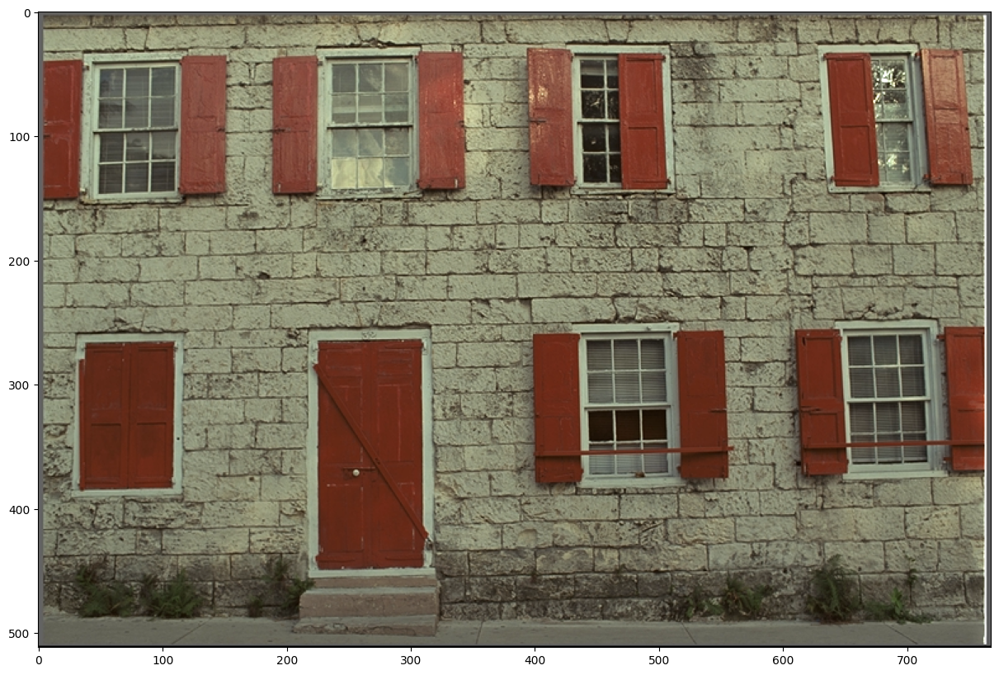

In [153]:
img = cv2.imread('../data/kodim01.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

(<matplotlib.image.AxesImage at 0x152f3cb7730>,
 Text(0.5, 1.0, 'Blurred, ksize=5, sigma=5'))

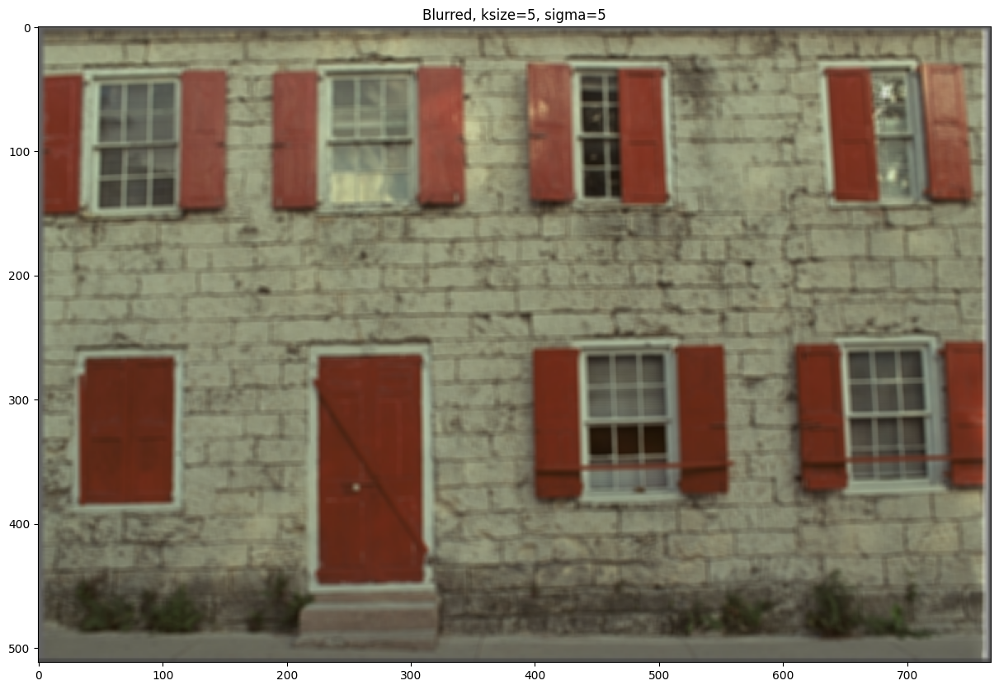

In [154]:
# Create a blurred (unsharp) version of the original image (you can use Gaussian blurring)
unsharp = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=5)

plt.imshow(unsharp), plt.title('Blurred, ksize=5, sigma=5')

float32 -118.0 161.0


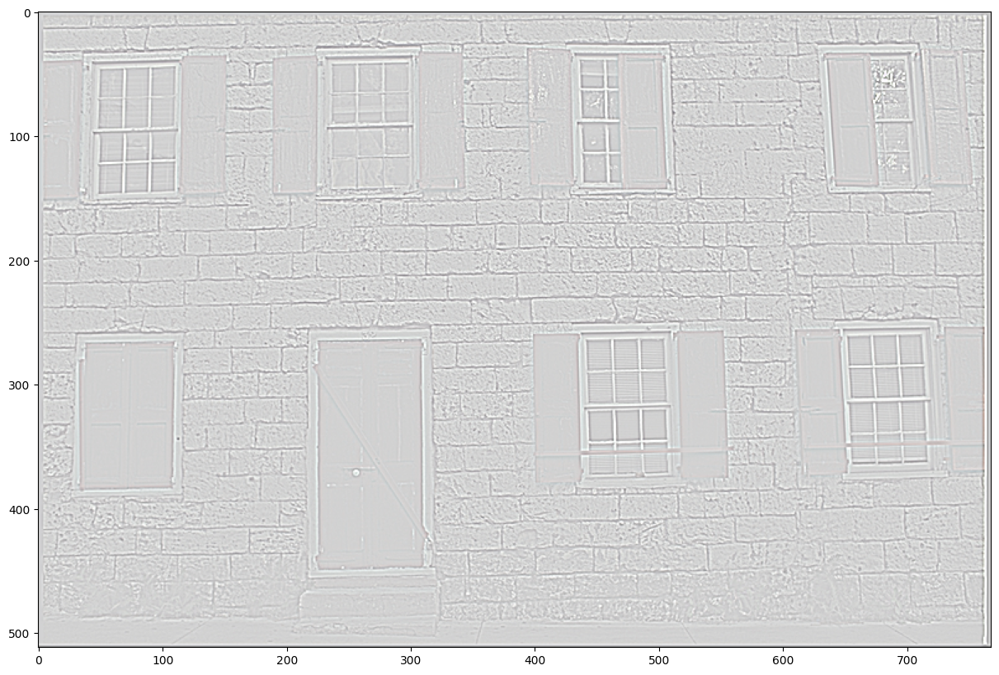

In [155]:
# Create the difference image (original − unsharp)
# Note: Remember that you are working with uint8 data types. Any addition or substractions
# might result in overflow or underflow, respectively. You can prevent this by casting the images to float.
diff = img.astype(np.float32) - unsharp.astype(np.float32)

print(diff.dtype, np.min(diff), np.max(diff))
plt.imshow(((diff + 255) / (310)).clip(min=0, max=1)); # normalized

(512, 768) White pixels: 1540
(512, 768) Black pixels: 585
Original White pixels: 768
Original Black pixels: 544


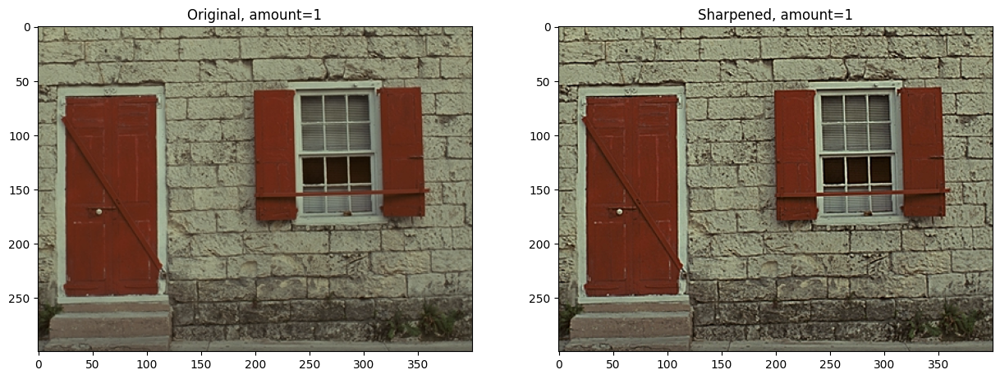

In [156]:
# Apply USM to get the resulting image using `sharpened = original + (original − unsharp) × amount`
# Note: Again, take care of underflows/overflows if necessary.
sharpened = (img + 0.5 * diff).clip(min=0, max=255).astype(np.uint8)

w_num = (sharpened == 0).all(axis=-1)
print(w_num.shape, 'White pixels:', np.sum(w_num))

b_num = (sharpened == 255).all(axis=-1)
print(b_num.shape, 'Black pixels:', np.sum(b_num))

print('Original White pixels:', np.sum((img == 0).all(axis=-1)))
print('Original Black pixels:', np.sum((img == 255).all(axis=-1)))

plt.subplot(121), plt.imshow(img[200:500, 200:600]), plt.title('Original, amount=1')
plt.subplot(122), plt.imshow(sharpened[200:500, 200:600]), plt.title('Sharpened, amount=1');

### Questions
* What is a good (reasonable) value for the `amount` parameter?
 * What happens if it is too small?
 * What happens if it is too large?

### Answers
It actually depends on the level of blur applied (ksize and sigma), and also on the image and how sharp it is already. *And on the task.*
- If the amount is too small, the changes are just too vague and insignificant.
- If the amount is too large, then we loose a lot of image content.

Content loss can be somewhat measured by counting how much more white and black pixels we get from the transformation. *That is beacause e.g. when we transform the intensities to be >255, they get clipped down to 255 and the relations between intensities are being lost.*  

For this particular image and using ksize=(5,5), sigma=5 (which looks like significant blur):
- amount=0.1 is unnoticable, but there is almost no content loss
- amount=0.5 is already obvious, and the content loss is small (doubled whites, ~ same blacks)
- amount=1 looks very sharp, the content loss is significant (x8 whites, x2 blacks)
- amount=10 looks completely broken for this image (x10k for both)

So, for this image [0.1..1] looks reasonable, with 0.5 appearing to be good for strongly sharpening the image but not breaking it.

It also seems that if there are more tiny details on the image, then we should consider using smaller blur kernel (to try to save them). And vise versa, if there are no small details, we can use larger kernel to make smoother transitions on the edges.  
*In practice it only looks like the edges become thiker and there is no obvious benefit to that, considering that computation is much more difficult with big kernels and we loose more information on edges.*

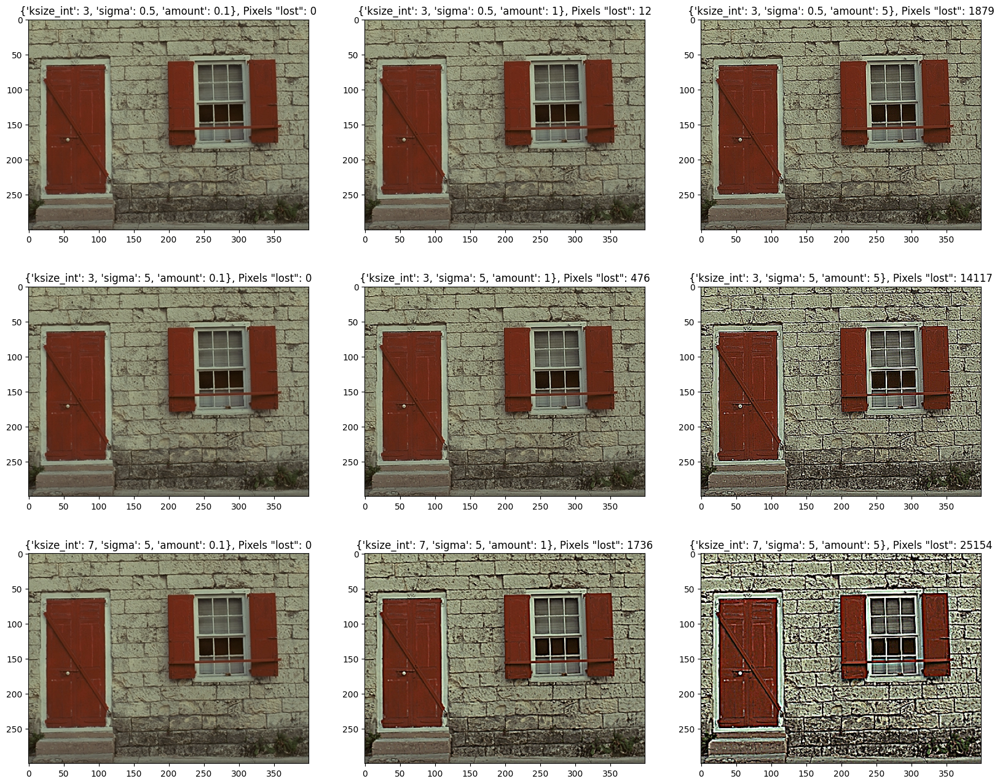

In [157]:
def calc_content_loss(orig, sharp):
    orig_w = np.sum((orig == 0).all(axis=-1))
    orig_b = np.sum((orig == 255).all(axis=-1))
    sharp_w = np.sum((sharp == 0).all(axis=-1))
    sharp_b = np.sum((sharp == 255).all(axis=-1))
    return sharp_w + sharp_b - orig_w - orig_b

def apply_USP(orig, ksize_int=3, sigma=1, amount=1):
    unsharp = cv2.GaussianBlur(orig, ksize=(ksize_int,ksize_int), sigmaX=sigma)
    diff = orig.astype(np.float32) - unsharp.astype(np.float32)
    sharpened = (orig + amount * diff).clip(min=0, max=255).astype(np.uint8)
    return sharpened

def plot_img_USP(image):
    param_grid=[
        {'ksize_int': 3, 'sigma': 0.5, 'amount': 0.1},
        {'ksize_int': 3, 'sigma': 0.5, 'amount': 1},
        {'ksize_int': 3, 'sigma': 0.5, 'amount': 5},
        
        {'ksize_int': 3, 'sigma': 5, 'amount': 0.1},
        {'ksize_int': 3, 'sigma': 5, 'amount': 1},
        {'ksize_int': 3, 'sigma': 5, 'amount': 5},
        
        {'ksize_int': 7, 'sigma': 5, 'amount': 0.1},
        {'ksize_int': 7, 'sigma': 5, 'amount': 1},
        {'ksize_int': 7, 'sigma': 5, 'amount': 5},
    ]

    plt.figure(figsize=(20, 16))

    for i, param_dict in enumerate(param_grid):
        sharp = apply_USP(image, **param_dict)

        plt.subplot(3, 3, i+1), plt.imshow(sharp)
        plt.title(f'{param_dict}, Pixels "lost": {calc_content_loss(image, sharp)}')

plot_img_USP(img[200:500, 200:600])

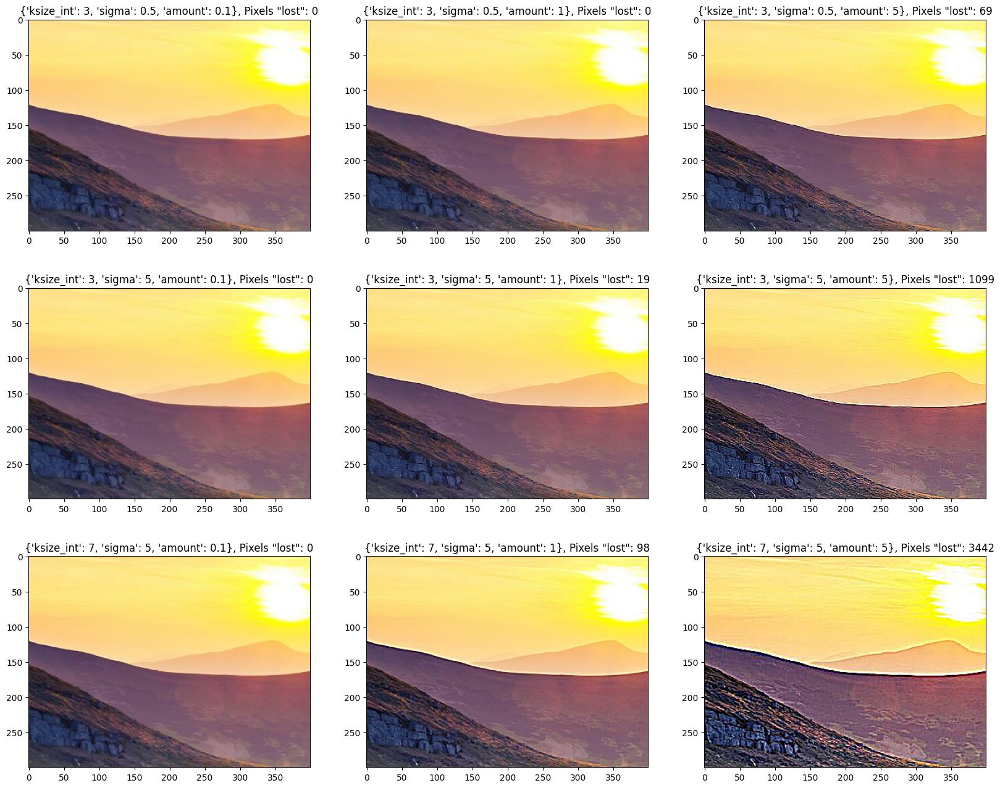

In [158]:
img1 = cv2.imread('mountains.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

plot_img_USP(img1[200:500, 200:600])

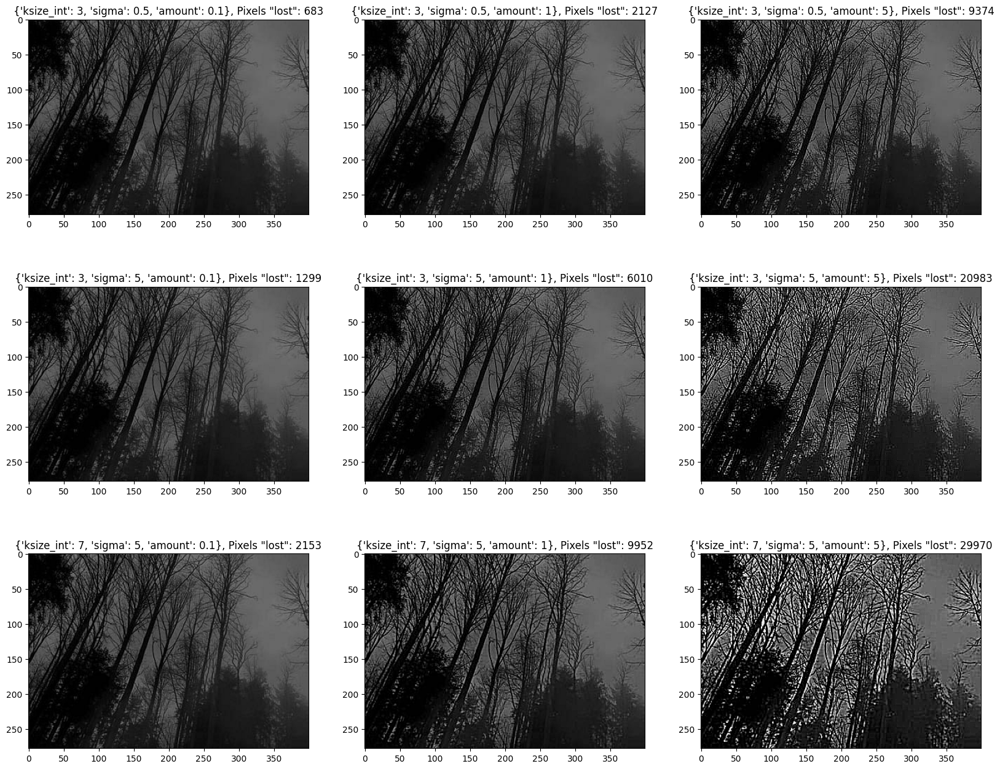

In [159]:
img2 = cv2.imread('trees.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plot_img_USP(img2[200:500, 200:600])